# Análisis Exploratorio de Datos

Antes de comenzar con el análisis, debemos cargar los datos.

In [74]:
import pandas as pd

In [75]:
def exploratory_data_analysis(dataframe):
    '''
    Recibe un dataframe y realiza un análisis exploratorio de los datos.

    Args
        dataframe (pd.DataFrame): Datos a analizar.
    '''
    print(f'Dimensiones del dataframe: {dataframe.shape}\n')

    print(f'Columnas del dataframe: {dataframe.columns}\n')

    print('Primeros 5 registros:')
    display(dataframe.head())

    print('Últimos 5 registros:')
    display(dataframe.tail())

    print('Muestra aleatoria:')
    display(dataframe.sample(5))

    print('Descripción de variables numéricas:')
    display(dataframe.describe())

    # -----------------------------------------------
    # print('Cantidad de valores nulos por columna:')
    # display(dataframe.isnull().sum())

    # print('Cantidad de valores únicos:')
    # display(dataframe.nunique())
    # -----------------------------------------------

def get_highly_correlated_pairs(corr_matrix, threshold=0.8):
    """
    Extrae pares de variables altamente correlacionadas según un umbral dado.
    """
    correlated_pairs = []
    
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            var1 = corr_matrix.columns[i]
            var2 = corr_matrix.columns[j]
            correlation = corr_matrix.iloc[i, j]
            
            if abs(correlation) >= threshold:
                correlated_pairs.append((var1, var2, correlation))
    
    return correlated_pairs


In [76]:
df = pd.read_parquet("C:/Users/lucas/OneDrive/Documentos/Universidad/Laboratorio de Programación Científica para Ciencia de Datos/Proyecto-Lab-MDS/competition_files/X_t0.parquet")
labels = pd.read_parquet("C:/Users/lucas/OneDrive/Documentos/Universidad/Laboratorio de Programación Científica para Ciencia de Datos/Proyecto-Lab-MDS/competition_files/y_t0.parquet")

df = pd.concat([df, labels], axis=1)

exploratory_data_analysis(df)

Dimensiones del dataframe: (44296, 78)

Columnas del dataframe: Index(['borrow_block_number', 'borrow_timestamp', 'wallet_address',
       'first_tx_timestamp', 'last_tx_timestamp', 'wallet_age',
       'incoming_tx_count', 'outgoing_tx_count', 'net_incoming_tx_count',
       'total_gas_paid_eth', 'avg_gas_paid_per_tx_eth', 'risky_tx_count',
       'risky_unique_contract_count', 'risky_first_tx_timestamp',
       'risky_last_tx_timestamp', 'risky_first_last_tx_timestamp_diff',
       'risky_sum_outgoing_amount_eth', 'outgoing_tx_sum_eth',
       'incoming_tx_sum_eth', 'outgoing_tx_avg_eth', 'incoming_tx_avg_eth',
       'max_eth_ever', 'min_eth_ever', 'total_balance_eth', 'risk_factor',
       'total_collateral_eth', 'total_collateral_avg_eth',
       'total_available_borrows_eth', 'total_available_borrows_avg_eth',
       'avg_weighted_risk_factor', 'risk_factor_above_threshold_daily_count',
       'avg_risk_factor', 'max_risk_factor', 'borrow_amount_sum_eth',
       'borrow_amount_av

,borrow_block_number,borrow_timestamp,wallet_address,first_tx_timestamp,last_tx_timestamp,wallet_age,incoming_tx_count,outgoing_tx_count,net_incoming_tx_count,total_gas_paid_eth,...,market_max_drawdown_365d,market_natr,market_plus_di,market_plus_dm,market_ppo,market_rocp,market_rocr,unique_borrow_protocol_count,unique_lending_protocol_count,target
0,7711117,1.557197e+09,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,1.537224e+09,1.557197e+09,19973049.0,199,438,-239,0.397391,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,1
1,7711123,1.557197e+09,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,1.537224e+09,1.557197e+09,19973188.0,200,439,-239,0.399063,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,1,1,1
2,7711126,1.557197e+09,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,1.537224e+09,1.557197e+09,19973238.0,201,440,-239,0.400895,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,1,1,1
3,7711672,1.557205e+09,0xa7ff0d561cd15ed525e31bbe0af3fe34ac2059f6,1.557191e+09,1.557198e+09,13922.0,8,56,-48,0.604001,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,0
4,7712572,1.557217e+09,0xbd9ed130a53cfafcf81502e4d35329a6c4d53410,1.557217e+09,1.557217e+09,264.0,2,3,-1,0.003008,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,0


Últimos 5 registros:


,borrow_block_number,borrow_timestamp,wallet_address,first_tx_timestamp,last_tx_timestamp,wallet_age,incoming_tx_count,outgoing_tx_count,net_incoming_tx_count,total_gas_paid_eth,...,market_max_drawdown_365d,market_natr,market_plus_di,market_plus_dm,market_ppo,market_rocp,market_rocr,unique_borrow_protocol_count,unique_lending_protocol_count,target
44291,10336599,1.593110e+09,0xa821dee44fe91e79535762a466f6a09fc6727891,1.592795e+09,1.593110e+09,315154.0,50,53,-3,0.280005,...,-0.736622,4.385686,19.552328,24.502158,-1.672639,0.007081,1.007081,1,1,1
44292,10336621,1.593110e+09,0xc25c5e0495287cc3a380703b2b665da5964d35ea,1.589820e+09,1.593110e+09,3290294.0,536,606,-70,5.723699,...,-0.736622,4.385686,19.552328,24.502158,-1.672639,0.007081,1.007081,1,1,1
44293,10336624,1.593110e+09,0xa0f75491720835b36edc92d06ddc468d201e9b73,1.568312e+09,1.593110e+09,24797983.0,393,423,-30,2.343277,...,-0.736622,4.385686,19.552328,24.502158,-1.672639,0.007081,1.007081,1,1,0
44294,10336627,1.593110e+09,0x07582f51171839586e42a46d4f68c70a5eb72f93,1.561659e+09,1.593110e+09,31451728.0,45,49,-4,0.331227,...,-0.736622,4.385686,19.552328,24.502158,-1.672639,0.007081,1.007081,1,1,0
44295,10336628,1.593110e+09,0x9cdb491354086ab189dbb17360c33970b7298d3f,1.505810e+09,1.593107e+09,87300319.0,389,230,159,0.498198,...,-0.736622,4.385686,19.552328,24.502158,-1.672639,0.007081,1.007081,1,1,0


Muestra aleatoria:


,borrow_block_number,borrow_timestamp,wallet_address,first_tx_timestamp,last_tx_timestamp,wallet_age,incoming_tx_count,outgoing_tx_count,net_incoming_tx_count,total_gas_paid_eth,...,market_max_drawdown_365d,market_natr,market_plus_di,market_plus_dm,market_ppo,market_rocp,market_rocr,unique_borrow_protocol_count,unique_lending_protocol_count,target
2660,8126992,1.562809e+09,0x4758a12fb01dc7cad5741246b9e2eb59ae1ef38b,1.551184e+09,1.562809e+09,11624619.0,15,22,-7,0.017151,...,-0.838674,4.725358,25.344453,66.808094,0.930797,-0.002386,0.997614,1,1,0
29376,9820288,1.586200e+09,0x586e32930ac05127de429bd566eaa2758fcbd9bc,1.522918e+09,1.586199e+09,63281973.0,16335,19239,-2904,32.676883,...,-0.736622,8.265225,20.543937,31.216881,2.478967,0.037475,1.037475,1,1,1
15751,9019136,1.575000e+09,0xa43d0765cbe4d17830fccdb27a77fb22dcd5bb35,1.553919e+09,1.575000e+09,21080976.0,482,682,-200,0.803299,...,-0.629765,6.096793,13.345806,15.565583,-7.911278,-0.159737,0.840263,1,1,1
7638,8377587,1.566174e+09,0x18c42014fb0aed3e35515eb45df8498af67773a4,1.564026e+09,1.566168e+09,2147910.0,129,143,-14,0.063225,...,-0.730282,6.751932,18.333745,28.767561,-3.785832,-0.119707,0.880293,1,1,0
28353,9730776,1.585007e+09,0x08a884c7971e83e78dd129be9b5e2723f3c43282,1.581619e+09,1.585006e+09,3388255.0,1263,2145,-882,2.478771,...,-0.736622,10.531059,17.358200,45.131898,-27.840793,0.097680,1.097680,1,1,1


Descripción de variables numéricas:


,borrow_block_number,borrow_timestamp,first_tx_timestamp,last_tx_timestamp,wallet_age,incoming_tx_count,outgoing_tx_count,net_incoming_tx_count,total_gas_paid_eth,avg_gas_paid_per_tx_eth,...,market_max_drawdown_365d,market_natr,market_plus_di,market_plus_dm,market_ppo,market_rocp,market_rocr,unique_borrow_protocol_count,unique_lending_protocol_count,target
count,4.429600e+04,4.429600e+04,4.429600e+04,4.429600e+04,4.429600e+04,44296.000000,44296.000000,44296.000000,44296.000000,44296.000000,...,44296.000000,44296.000000,44296.000000,44296.000000,44296.000000,44296.000000,44296.000000,44296.000000,44296.000000,44296.000000
mean,9.343121e+06,1.579559e+09,1.550122e+09,1.579501e+09,2.943773e+07,999.369514,1360.256231,-360.886717,2.717345,0.002874,...,-0.717461,5.533406,22.260178,34.435369,0.267880,-0.006844,0.993156,0.846758,0.970268,0.511468
std,7.772108e+05,1.070282e+07,2.936277e+07,1.071609e+07,2.897753e+07,3065.153260,3936.526950,2167.545039,13.380028,0.008137,...,0.064708,1.532826,9.163070,18.010626,8.010179,0.153774,0.153774,0.360225,0.169848,0.499874
min,7.711117e+06,1.557197e+09,1.438270e+09,1.557197e+09,1.370000e+02,1.000000,0.000000,-68013.000000,0.000000,0.000000,...,-0.895911,3.089819,6.297847,5.413265,-29.248726,-0.545814,0.454186,0.000000,0.000000,0.000000
25%,8.638256e+06,1.569687e+09,1.522918e+09,1.569553e+09,3.641601e+06,34.000000,52.000000,-198.000000,0.076647,0.000937,...,-0.736622,4.520733,15.789090,20.398524,-4.305614,-0.073433,0.926567,1.000000,1.000000,0.000000
50%,9.470717e+06,1.581544e+09,1.558756e+09,1.581499e+09,1.900256e+07,134.000000,207.000000,-49.000000,0.349336,0.001550,...,-0.736622,5.229391,19.489917,30.411080,0.303495,-0.011708,0.988292,1.000000,1.000000,1.000000
75%,1.008743e+07,1.589770e+09,1.573658e+09,1.589671e+09,5.196818e+07,471.000000,678.000000,-8.000000,1.406124,0.002773,...,-0.668565,6.303838,27.579281,43.521182,5.438241,0.072939,1.072939,1.000000,1.000000,1.000000
max,1.033663e+07,1.593110e+09,1.593109e+09,1.593151e+09,1.540836e+08,98747.000000,71087.000000,97831.000000,506.170766,0.415178,...,-0.565216,11.588088,56.729534,108.686030,19.424855,0.534402,1.534402,1.000000,1.000000,1.000000


In [77]:
# Cantidad de nulos
for column in df.columns:
    print(f"{column}: {df[column].isnull().sum()}")

borrow_block_number: 0
borrow_timestamp: 0
wallet_address: 0
first_tx_timestamp: 0
last_tx_timestamp: 0
wallet_age: 0
incoming_tx_count: 0
outgoing_tx_count: 0
net_incoming_tx_count: 0
total_gas_paid_eth: 0
avg_gas_paid_per_tx_eth: 0
risky_tx_count: 0
risky_unique_contract_count: 0
risky_first_tx_timestamp: 0
risky_last_tx_timestamp: 0
risky_first_last_tx_timestamp_diff: 0
risky_sum_outgoing_amount_eth: 0
outgoing_tx_sum_eth: 0
incoming_tx_sum_eth: 0
outgoing_tx_avg_eth: 0
incoming_tx_avg_eth: 0
max_eth_ever: 0
min_eth_ever: 0
total_balance_eth: 0
risk_factor: 0
total_collateral_eth: 0
total_collateral_avg_eth: 0
total_available_borrows_eth: 0
total_available_borrows_avg_eth: 0
avg_weighted_risk_factor: 0
risk_factor_above_threshold_daily_count: 0
avg_risk_factor: 0
max_risk_factor: 0
borrow_amount_sum_eth: 0
borrow_amount_avg_eth: 0
borrow_count: 0
repay_amount_sum_eth: 0
repay_amount_avg_eth: 0
repay_count: 0
borrow_repay_diff_eth: 0
deposit_count: 0
deposit_amount_sum_eth: 0
time_si

In [78]:
# Cantidad de valores únicos
for column in df.columns:
    print(f"{column}: {df[column].nunique()}")

borrow_block_number: 42584
borrow_timestamp: 42584
wallet_address: 6788
first_tx_timestamp: 6662
last_tx_timestamp: 42555
wallet_age: 44069
incoming_tx_count: 5193
outgoing_tx_count: 6220
net_incoming_tx_count: 3146
total_gas_paid_eth: 44250
avg_gas_paid_per_tx_eth: 44247
risky_tx_count: 108
risky_unique_contract_count: 24
risky_first_tx_timestamp: 2127
risky_last_tx_timestamp: 5683
risky_first_last_tx_timestamp_diff: 4766
risky_sum_outgoing_amount_eth: 4387
outgoing_tx_sum_eth: 39320
incoming_tx_sum_eth: 41229
outgoing_tx_avg_eth: 43140
incoming_tx_avg_eth: 44065
max_eth_ever: 9095
min_eth_ever: 7822
total_balance_eth: 24180
risk_factor: 31402
total_collateral_eth: 38220
total_collateral_avg_eth: 36828
total_available_borrows_eth: 41662
total_available_borrows_avg_eth: 37125
avg_weighted_risk_factor: 33815
risk_factor_above_threshold_daily_count: 6588
avg_risk_factor: 33887
max_risk_factor: 8637
borrow_amount_sum_eth: 34824
borrow_amount_avg_eth: 35723
borrow_count: 2466
repay_amount_

In [79]:
# Tipo de variables
for column in df.columns:
    print(f"{column}: {df[column].dtype}")

borrow_block_number: int64
borrow_timestamp: float64
wallet_address: object
first_tx_timestamp: float64
last_tx_timestamp: float64
wallet_age: float64
incoming_tx_count: int64
outgoing_tx_count: int64
net_incoming_tx_count: int64
total_gas_paid_eth: float64
avg_gas_paid_per_tx_eth: float64
risky_tx_count: int64
risky_unique_contract_count: int64
risky_first_tx_timestamp: int64
risky_last_tx_timestamp: int64
risky_first_last_tx_timestamp_diff: int64
risky_sum_outgoing_amount_eth: float64
outgoing_tx_sum_eth: float64
incoming_tx_sum_eth: float64
outgoing_tx_avg_eth: float64
incoming_tx_avg_eth: float64
max_eth_ever: float64
min_eth_ever: float64
total_balance_eth: float64
risk_factor: float64
total_collateral_eth: float64
total_collateral_avg_eth: float64
total_available_borrows_eth: float64
total_available_borrows_avg_eth: float64
avg_weighted_risk_factor: float64
risk_factor_above_threshold_daily_count: float64
avg_risk_factor: float64
max_risk_factor: float64
borrow_amount_sum_eth: fl

Podemos ver que este dataset se compone de $44.296$ observaciones, donde cada una posee $77$ variables que representan diversas cosas: fechas y horas de transacciones, cantidad de transacciones, factor de riesgo, entre otras. Una variable extra corresponde a la variable de interés (`target`), indicando el estado de morosidad del cliente y siendo lo que queremos predecir. Podemos ver además que la mayoría de las variables pertenecen a tipo numéricas, las cuales varían en rangos positivos y negativos, además de la existencia de una única variable de tipo `object` que representa la dirección de la billetera asociada (`wallet_address`). De acá podemos ver que, dentro del dataset, existen sólo $6.788$ cuentas asociadas a transacciones. Veamos a partir de ellas cómo son sus comportamientos:

In [80]:
df["wallet_address"].value_counts().sort_values(ascending=False).head(10)

wallet_address
0x586e32930ac05127de429bd566eaa2758fcbd9bc    2467
0x3e2dbda5f310aade1503557b2e7f356eaf161641     410
0x9709a9f77d4349e1da4220f1458fbe9339d612e3     401
0x40335581dd8692b698762168908d4ea23b0b94f9     296
0x18c42014fb0aed3e35515eb45df8498af67773a4     281
0xa25cc31f54fd90bba0d653e936d78f9ca137723f     252
0x8f9f67770c8cbfff7d5748d15996dc1cfb2fc5fc     245
0x430c96378f8918736173252a7bb056d35f4c2ce6     235
0x63d245384870dd42d396887c57cb3b6ef2ad605d     209
0x08a884c7971e83e78dd129be9b5e2723f3c43282     204
Name: count, dtype: int64

In [81]:
# 'wallet_address' = 0x586e32930ac05127de429bd566eaa2758fcbd9bc
a = df[df["wallet_address"] == "0x586e32930ac05127de429bd566eaa2758fcbd9bc"]
a[["wallet_address", "incoming_tx_count", "outgoing_tx_count"]].value_counts().sort_values(ascending=False).head(10)

wallet_address                              incoming_tx_count  outgoing_tx_count
0x586e32930ac05127de429bd566eaa2758fcbd9bc  1269               1434                 1
                                            1338               1513                 1
                                            1385               1555                 1
                                            1383               1553                 1
                                            1275               1442                 1
                                            1279               1447                 1
                                            1283               1452                 1
                                            1315               1485                 1
                                            1328               1498                 1
                                            1341               1517                 1
Name: count, dtype: int64

In [82]:
# 'wallet_address' = 0x3e2dbda5f310aade1503557b2e7f356eaf161641
a = df[df["wallet_address"] == "0x3e2dbda5f310aade1503557b2e7f356eaf161641"]
a[["wallet_address", "incoming_tx_count", "outgoing_tx_count"]].value_counts().sort_values(ascending=False).head(10)

wallet_address                              incoming_tx_count  outgoing_tx_count
0x3e2dbda5f310aade1503557b2e7f356eaf161641  299                357                  1
                                            374                454                  1
                                            324                398                  1
                                            327                401                  1
                                            333                406                  1
                                            336                409                  1
                                            341                419                  1
                                            348                427                  1
                                            353                432                  1
                                            356                435                  1
Name: count, dtype: int64

In [83]:
df["wallet_address"].value_counts().sort_values(ascending=False).tail(10)

wallet_address
0x0cbe265011306fd86438c7d23d0dfb1721c20763    1
0xa2fd2c23b67b1d674706e23086375097bffc2177    1
0x14798b4bf5dfab48d0249e4c84e38ceef5a044e3    1
0xb6a312b525de98cbd6c73a63e46a1e9acb835c64    1
0xc2842a7653b9c2272f424a18dff468c32d1f874d    1
0x361999adc5282d3a5dc101776596d2c8005f6c48    1
0x341430973e913c8a44b7f79e9c727d20b7d1d8b0    1
0x8cac97395db07b31c3bb1e93e9d384ac8197c180    1
0x8e6d27ffced9e9d838f4893f7f949d2493a2aeb4    1
0x37d7b8aaf08df710245077e69922b508e46ebf4e    1
Name: count, dtype: int64

Podemos ver que hay cuentas que tienen bastantes observaciones, teniendo 6 veces más que la segunda cuenta con más observaciones. Además, la cantidad de transacciones por observación casi alcanza las $3.000$. Por otro lado, tenemos clientes que registran únicamente una transacción.

In [84]:
df_incoming = df["incoming_tx_count"].groupby(df["wallet_address"]).sum().sort_values(ascending=False)
df_outgoing = df["outgoing_tx_count"].groupby(df["wallet_address"]).sum().sort_values(ascending=False)

df_in_out = pd.merge(df_incoming, df_outgoing, on="wallet_address", how="outer")
df_in_out['total_tx_count'] = df_in_out['incoming_tx_count'] + df_in_out['outgoing_tx_count']

df_top10 = df_in_out.nlargest(10, 'total_tx_count')
df_bottom_10 = df_in_out.nsmallest(10, 'total_tx_count')

In [85]:
# Histograma para total_tx_count
import plotly.express as px
fig = px.histogram(df_in_out, x="total_tx_count",
                   marginal="box",
                   title="Histograma de total_tx_count")
fig.show()

Vemos la presencia de outliers y para un cliente en especial que presenta muchas observaciones. El $50\%$ de los datos se encuentra dentro del rango entre $1$ y $2.300$ transacciones en total

In [86]:
fig = px.bar(df_top10, x=df_top10.index, y=["incoming_tx_count", "outgoing_tx_count"], title="Cantidad de transacciones entrantes y salientes por wallet_address")
fig.show()

Lo primero que vemos es que hay una cuenta en particular que tienen la mayor cantidad de transacciones hechas y ronda los $57$ millones de transacciones. Luego se baja a cerca de $3$ millones y después pareciera mantenerse en el millón de transacciones.

In [87]:
import plotly.express as px

fig = px.bar(df_bottom_10, x=df_bottom_10.index, y=["incoming_tx_count", "outgoing_tx_count"], title="Cantidad de transacciones entrantes y salientes por wallet_address")
fig.show()

Acá vemos que los clientes que menos transacciones tienen se mantienen bajo las $2$ en total, siendo un contrastre bastante grande a diferencia de los primeros clientes.

Veamos los tiempos en que estas transacciones se realizan:

In [88]:
# Convertir columnas timestamp a datetime (duda con risky_first_last_tx_timestamp_diff y time_since_last_liquidated)
time_columns = ['borrow_timestamp', 'first_tx_timestamp', 'last_tx_timestamp', 'risky_first_tx_timestamp', 'risky_last_tx_timestamp']
for column in time_columns:
    df[column] = pd.to_datetime(df[column], unit='s')

# Extraer la fecha más antigua de borrow_timestamp
print(f'Fecha más antigua de borrow_timestamp: {df["borrow_timestamp"].min()}')

# Extraer la fecha más reciente de borrow_timestamp
print(f'Fecha más reciente de borrow_timestamp: {df["borrow_timestamp"].max()}\n')

# Extraer la fecha más antigua de first_tx_timestamp
print(f'Fecha más antigua de first_tx_timestamp: {df["first_tx_timestamp"].min()}')

# Extraer la fecha más reciente de last_tx_timestamp
print(f'Fecha más reciente de last_tx_timestamp: {df["last_tx_timestamp"].max()}\n')

# Convertir las columnas risky_first_last_tx_timestamp_diff y time_since_last_liquidated a timedelta 
other_time_columns = ['risky_first_last_tx_timestamp_diff', 'time_since_last_liquidated']
for column in other_time_columns:
    df[column] = pd.to_timedelta(df[column], unit='s')

# Extraer la duración más corta de risky_first_last_tx_timestamp_diff
print(f'Duración más corta de risky_first_last_tx_timestamp_diff: {df["risky_first_last_tx_timestamp_diff"].min()}')

# Extraer la duración más larga de risky_first_last_tx_timestamp_diff
print(f'Duración más larga de risky_first_last_tx_timestamp_diff: {df["risky_first_last_tx_timestamp_diff"].max()}\n')

# Extraer la duración más corta de time_since_last_liquidated
print(f'Duración más corta de time_since_last_liquidated: {df["time_since_last_liquidated"].min()}')

# Extraer la duración más larga de time_since_last_liquidated
print(f'Duración más larga de time_since_last_liquidated: {df["time_since_last_liquidated"].max()}')

Fecha más antigua de borrow_timestamp: 2019-05-07 02:48:28
Fecha más reciente de borrow_timestamp: 2020-06-25 18:37:27

Fecha más antigua de first_tx_timestamp: 2015-07-30 15:26:13
Fecha más reciente de last_tx_timestamp: 2020-06-26 05:54:48

Duración más corta de risky_first_last_tx_timestamp_diff: 0 days 00:00:00
Duración más larga de risky_first_last_tx_timestamp_diff: 21 days 04:42:36

Duración más corta de time_since_last_liquidated: 0 days 00:00:08
Duración más larga de time_since_last_liquidated: 11574 days 01:46:39


Podemos ver que este dataset contiene datos entre julio de 2015 y junio de 2020.

Veamos cómo se comportan los clientes dependiendo de su morosidad.

In [89]:
# Distribución de clientes morosos
df['target'].value_counts()

target
1    22656
0    21640
Name: count, dtype: int64

Podemos ver que hay una cantidad balanceada entre clientes morosos y no morosos. Veamos para el `wallet_address = 0x586e32930ac05127de429bd566eaa2758fcbd9bc` (que tiene cerca de $2.400$ observaciones) cómo distribuyen los períodos de morosidad:

In [90]:
df_first = df[df['wallet_address'] == '0x586e32930ac05127de429bd566eaa2758fcbd9bc']
df_first['target'].value_counts()

target
1    2443
0      24
Name: count, dtype: int64

Este cliente en particular, muchas de las observaciones lo catalogan como moroso.

In [91]:
# Gráfica de cómo distribuyen los clientes morosos según `wallet_age`
fig = px.histogram(df, x="wallet_age", color="target", title="Distribución de clientes morosos según wallet_age", marginal="box")
fig.show()

Acá no existe una tendencia clara a que, dependiendo de la edad de la cuenta, ésta sea más o menos propensa a caer en morosidad, por lo que habría que explorar otras variables.

In [92]:
# Gráfica de cómo distribuyen los clientes morosos según `risk_factor`
fig = px.histogram(df, x="risk_factor", color="target", title="Distribución de clientes morosos según risk_factor", marginal="box")
fig.show()

En este caso podemos ver que, cuentas con un factor de riesgo mayor, son justamente propensas a caer en morosidad.

Veamos cómo es la relación entre las distintas variables:

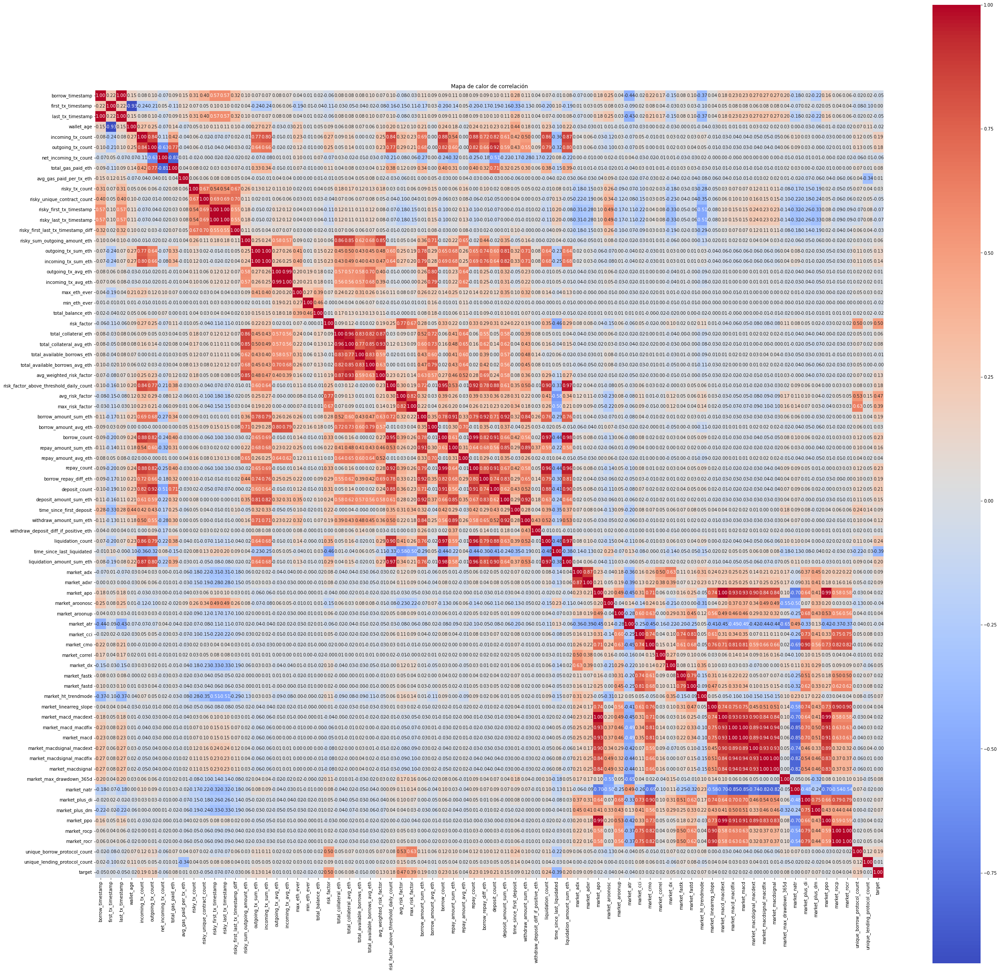

In [93]:
# Mapa de calor de correlación
import seaborn as sns
import matplotlib.pyplot as plt
df_test = df.drop(columns=['wallet_address', 'borrow_block_number'])
corr_matrix = df_test.corr()
plt.figure(figsize=(40, 40))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Mapa de calor de correlación')
plt.show()

In [94]:
correlated_pairs = get_highly_correlated_pairs(corr_matrix, threshold=0.8)
for pair in correlated_pairs:
    print(pair)

('borrow_timestamp', 'last_tx_timestamp', 0.9995444143123392)
('first_tx_timestamp', 'wallet_age', -0.9327727999486409)
('incoming_tx_count', 'outgoing_tx_count', 0.8367752228941443)
('incoming_tx_count', 'risk_factor_above_threshold_daily_count', 0.838449301113893)
('incoming_tx_count', 'borrow_count', 0.8801531269865367)
('incoming_tx_count', 'repay_count', 0.8783830281024695)
('incoming_tx_count', 'deposit_count', 0.8173494415189205)
('incoming_tx_count', 'liquidation_count', 0.8564491057530869)
('incoming_tx_count', 'liquidation_amount_sum_eth', 0.8671666271731732)
('outgoing_tx_count', 'borrow_count', 0.8157135552441362)
('outgoing_tx_count', 'repay_count', 0.8238010277800576)
('outgoing_tx_count', 'deposit_count', 0.9177580465394913)
('net_incoming_tx_count', 'total_gas_paid_eth', -0.8121419935729428)
('risky_first_tx_timestamp', 'risky_last_tx_timestamp', 0.9999997470907853)
('risky_sum_outgoing_amount_eth', 'total_collateral_eth', 0.8586855167035466)
('risky_sum_outgoing_amount

Podemos ver que existen variables que están altamente relacionadas entre ellas y que sobrepasan un umbral definido en $0.8$. Esto nos puede indicar que miden las mismas cosas pero desde puntos diferentes. Por ejemplo, variables como promedios y sumas suelen estar correlacionadas.

In [95]:
# Hay un 'wallet_address' que se repite muchas veces. Quiero eliminar todas las observaciones que tengan ese 'wallet_address'
df = df[df['wallet_address'] != '0x586e32930ac05127de429bd566eaa2758fcbd9bc']

df_incoming = df["incoming_tx_count"].groupby(df["wallet_address"]).sum().sort_values(ascending=False)
df_outgoing = df["outgoing_tx_count"].groupby(df["wallet_address"]).sum().sort_values(ascending=False)

df_in_out = pd.merge(df_incoming, df_outgoing, on="wallet_address", how="outer")
df_in_out['total_tx_count'] = df_in_out['incoming_tx_count'] + df_in_out['outgoing_tx_count']

df_top10 = df_in_out.nlargest(10, 'total_tx_count')
df_bottom_10 = df_in_out.nsmallest(10, 'total_tx_count')

In [96]:
# Histograma para total_tx_count
import plotly.express as px
fig = px.histogram(df_in_out, x="total_tx_count",
                   marginal="box",
                   title="Histograma de total_tx_count")
fig.show()

In [97]:
fig = px.bar(df_top10, x=df_top10.index, y=["incoming_tx_count", "outgoing_tx_count"], title="Cantidad de transacciones entrantes y salientes por wallet_address")
fig.show()

In [98]:
fig = px.bar(df_bottom_10, x=df_bottom_10.index, y=["incoming_tx_count", "outgoing_tx_count"], title="Cantidad de transacciones entrantes y salientes por wallet_address")
fig.show()

In [99]:
# Distribución de clientes morosos
df['target'].value_counts()

target
0    21616
1    20213
Name: count, dtype: int64

In [100]:
# Gráfica de cómo distribuyen los clientes morosos según `risk_factor`
fig = px.histogram(df, x="risk_factor", color="target", title="Distribución de clientes morosos según risk_factor", marginal="box")
fig.show()

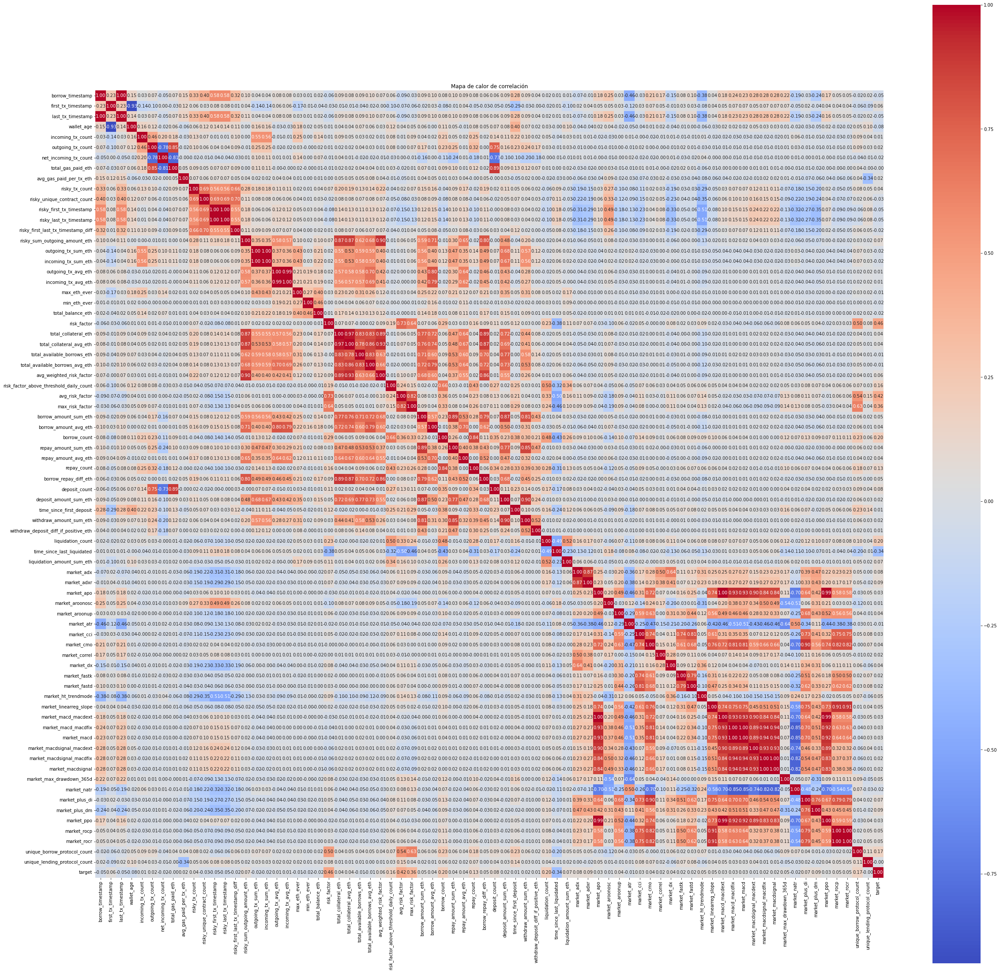

In [101]:
# Mapa de calor de correlación
import seaborn as sns
import matplotlib.pyplot as plt
df_test = df.drop(columns=['wallet_address', 'borrow_block_number'])
corr_matrix = df_test.corr()
plt.figure(figsize=(40, 40))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Mapa de calor de correlación')
plt.show()

# Preprocesamiento de Datos

El procesamiento de los datos contemplará las siguientes operaciones:

- Eliminación de variables muy relacionadas
- Conversión de variables `timestamp` a `datetime`
- Eliminación de *outliers*
- Normalización de variables numéricas

Finalmente se creará un *pipeline* que pueda procesar todas estas tareas.

## 2. Conversión de variables `timestamp` a `datetime`

In [104]:
date_variables = ['borrow_timestamp', 'first_tx_timestamp', 'last_tx_timestamp', 'risky_first_tx_timestamp', 'risky_last_tx_timestamp']
time_variables = ['wallet_age', 'risky_first_last_tx_timestamp_diff', 'risk_factor_above_threshold_daily_count', 'time_since_first_deposit', 'time_since_last_liquidated']

for column in date_variables:
    df[column] = pd.to_datetime(df[column], unit='s')

for column in time_variables:
    df[column] = pd.to_timedelta(df[column], unit='s')

In [105]:
display(df[date_variables])

display(df[time_variables])  

,borrow_timestamp,first_tx_timestamp,last_tx_timestamp,risky_first_tx_timestamp,risky_last_tx_timestamp
0,2019-05-07 02:48:28,2018-09-17 22:44:19,2019-05-07 02:44:34,2001-09-09 01:46:39,2001-09-09 01:46:39
1,2019-05-07 02:50:47,2018-09-17 22:44:19,2019-05-07 02:48:28,2001-09-09 01:46:39,2001-09-09 01:46:39
2,2019-05-07 02:51:37,2018-09-17 22:44:19,2019-05-07 02:50:47,2001-09-09 01:46:39,2001-09-09 01:46:39
3,2019-05-07 04:55:33,2019-05-07 01:03:31,2019-05-07 02:52:25,2001-09-09 01:46:39,2001-09-09 01:46:39
4,2019-05-07 08:20:08,2019-05-07 08:15:44,2019-05-07 08:19:14,2001-09-09 01:46:39,2001-09-09 01:46:39
...,...,...,...,...,...
44291,2020-06-25 18:31:12,2020-06-22 02:58:38,2020-06-25 18:30:10,2020-06-22 03:11:17,2020-06-25 18:30:10
44292,2020-06-25 18:35:36,2020-05-18 16:37:22,2020-06-25 18:33:23,2020-06-13 07:01:05,2020-06-24 18:55:47
44293,2020-06-25 18:36:45,2019-09-12 18:17:02,2020-06-25 18:35:02,2020-06-16 22:36:31,2020-06-25 18:31:06
44294,2020-06-25 18:37:14,2019-06-27 18:01:46,2020-06-25 18:26:06,2020-06-24 01:26:11,2020-06-24 23:34:26


,wallet_age,risky_first_last_tx_timestamp_diff,risk_factor_above_threshold_daily_count,time_since_first_deposit,time_since_last_liquidated
0,231 days 04:04:09,0 days 00:00:00,0 days 00:00:00,0 days 01:07:06,11574 days 01:46:39
1,231 days 04:06:28,0 days 00:00:00,0 days 00:00:00,0 days 01:09:25,11574 days 01:46:39
2,231 days 04:07:18,0 days 00:00:00,0 days 00:00:00,0 days 01:10:15,11574 days 01:46:39
3,0 days 03:52:02,0 days 00:00:00,0 days 00:00:00,0 days 02:07:41,11574 days 01:46:39
4,0 days 00:04:24,0 days 00:00:00,0 days 00:00:00,0 days 00:02:54,11574 days 01:46:39
...,...,...,...,...,...
44291,3 days 15:32:34,3 days 15:18:53,0 days 00:00:10,3 days 15:19:55,11574 days 01:46:39
44292,38 days 01:58:14,11 days 11:54:42,0 days 00:02:10,37 days 11:59:25,11574 days 01:46:39
44293,287 days 00:19:43,8 days 19:54:35,0 days 00:00:00,8 days 19:31:05,11574 days 01:46:39
44294,364 days 00:35:28,0 days 22:08:15,0 days 00:00:00,1 days 17:11:03,11574 days 01:46:39


## 1. Creación y Eliminación de variables muy relacionadas

Existen variables que están relacionadas entre sí, ya sea como promedios, multiplicaciones, diferencias entre fechas. Es por ello que primero se crearán algunas variables en relación a tiempos y luego se eliminarán con respecto a una nueva matriz de correlación.

In [106]:
# Duración de actividad
df['activity_duration'] = df['last_tx_timestamp'] - df['first_tx_timestamp']

# Tiempo hasta la primera liquidación
df['time_to_first_borrow'] = df['borrow_timestamp'] - df['first_tx_timestamp']

# Eliminar columnas originales
# df.drop(columns=['last_tx_timestamp', 'first_tx_timestamp', 'risky_first_tx_timestamp', 'risky_last_tx_timestamp'], inplace=True)

# delete = ['incoming_tx_count', 'outgoing_tx_count', 'market_apo', 'market_macd_macdext', 'market_macdsignal_macdext']
# df.drop(columns=delete, inplace=True)

In [107]:
corr_matrix = df_test.corr()
correlated_pairs = get_highly_correlated_pairs(corr_matrix, threshold=0.8)
names = []
for pair in correlated_pairs:
    print(pair)
    names.append(pair[0])

# Limpiar la lista de nombres (contiene nombres repetidos)
names = list(set(names))

('borrow_timestamp', 'last_tx_timestamp', 0.9995346016195086)
('first_tx_timestamp', 'wallet_age', -0.9306718736793254)
('outgoing_tx_count', 'total_gas_paid_eth', 0.8457014065892225)
('net_incoming_tx_count', 'total_gas_paid_eth', -0.8079789779340544)
('total_gas_paid_eth', 'deposit_count', 0.8922862346196582)
('risky_first_tx_timestamp', 'risky_last_tx_timestamp', 0.9999997496380468)
('risky_sum_outgoing_amount_eth', 'total_collateral_eth', 0.8660445143932654)
('risky_sum_outgoing_amount_eth', 'total_collateral_avg_eth', 0.8741263733076245)
('risky_sum_outgoing_amount_eth', 'avg_weighted_risk_factor', 0.9034316910521409)
('outgoing_tx_sum_eth', 'incoming_tx_sum_eth', 0.9995879338173466)
('outgoing_tx_avg_eth', 'incoming_tx_avg_eth', 0.9927648021017395)
('total_collateral_eth', 'total_collateral_avg_eth', 0.9677889935090391)
('total_collateral_eth', 'total_available_borrows_eth', 0.8322114700275116)
('total_collateral_eth', 'total_available_borrows_avg_eth', 0.8257038270372136)
('tota

In [108]:
df.drop(columns=names+['wallet_age'], inplace=True)

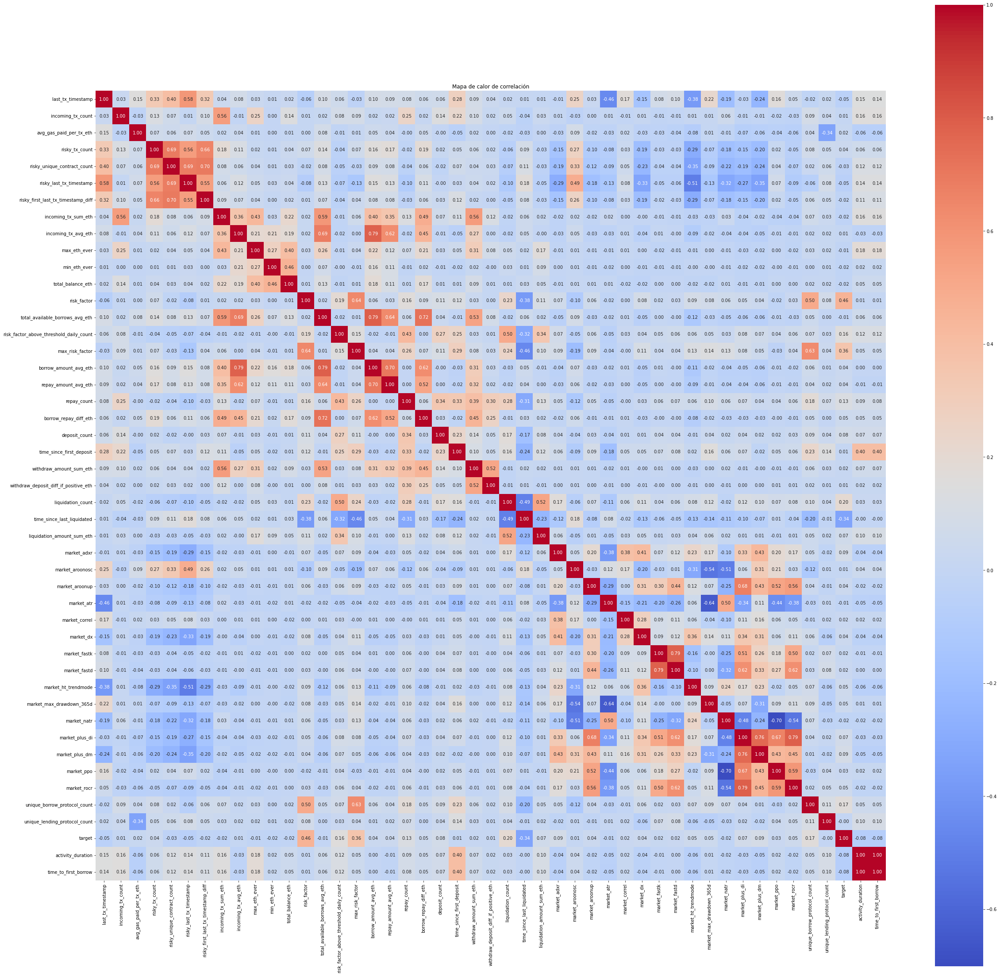

In [109]:
# Mapa de calor de correlación
df_test = df.drop(columns=['wallet_address', 'borrow_block_number'])
corr_matrix = df_test.corr()
plt.figure(figsize=(40, 40))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Mapa de calor de correlación')
plt.show()

## 3. Eliminación de *outliers*

In [110]:
import numpy as np

def remove_outliers(df, columns, method='iqr', threshold=1.5):
    """
    Elimina outliers de un DataFrame basado en un método seleccionado (IQR o Z-score).

    Parámetros:
    - df (DataFrame): El conjunto de datos original.
    - columns (list): Lista de nombres de columnas a procesar.
    - method (str): Método para detectar outliers. Opciones: 'iqr' o 'zscore'.
    - threshold (float): Umbral para identificar outliers:
        - Para 'iqr', este es el multiplicador del IQR (por defecto 1.5).
        - Para 'zscore', este es el límite del Z-score (por defecto 3).

    Retorna:
    - DataFrame sin outliers.
    """
    clean_df = df.copy()
    
    for column in columns:
        if method == 'iqr':
            # Rango Intercuartílico (IQR)
            Q1 = clean_df[column].quantile(0.25)
            Q3 = clean_df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
            clean_df = clean_df[(clean_df[column] >= lower_bound) & (clean_df[column] <= upper_bound)]
        
        elif method == 'zscore':
            # Z-score
            mean = clean_df[column].mean()
            std_dev = clean_df[column].std()
            clean_df = clean_df[np.abs((clean_df[column] - mean) / std_dev) <= threshold]
        
        else:
            raise ValueError("Método no soportado. Usa 'iqr' o 'zscore'.")
    
    return clean_df

## 4. Transformación de variables

## 5. Creación del *pipeline*

# División del conjunto de Datos

# Creación de Modelo Baseline

# Desarrollo de otros Modelos

# Interpretabilidad